<a href="https://colab.research.google.com/github/scanavi31/TFM_Clasificador_Residuos/blob/main/TFM_DATASET_0.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **TFM Clasificación de Residuos**


#### **Carga de librerias**


In [1]:
# instalar paquetes
!pip install datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 547.8/547.8 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 39.9/39.9 MB 16.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 20.0 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
  Attempting uninstall: pyarrow
    Found existing installation: pyarrow 14.0.2
    Uninstalling pyarrow-14.0.2:
      Successfully uninstalled pyarrow-14.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cudf-cu12 

In [2]:
## Carga de Librerias

# General
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from datasets import load_from_disk, DatasetDict
from tabulate import tabulate
import seaborn as sns

# Drive
from google.colab import files, drive

# OpenCV
import cv2
from google.colab.patches import cv2_imshow
# System
import os
import shutil
from tempfile import mkstemp

# Otros
import random
import matplotlib.image as mpimg
import warnings
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler
from PIL import Image
import io
from imutils import paths

# Ignorar advertencias
warnings.filterwarnings('ignore')

## 1. Carga de datos

### - Desde la plataforma Kaggle

In [ ]:
#Cargar el token
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ivancallejas","key":"f5b7e02fc599d562c62fa3fda06c17c5"}'}

In [ ]:
# Creación del directorio kaggle.json
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
#Listado de datasets
!kaggle datasets list

ref                                                             title                                             size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  -----------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
rabieelkharoua/students-performance-dataset                     📚 Students Performance Dataset 📚                  66KB  2024-06-12 23:09:20          12619        264  1.0              
nelgiriyewithana/most-streamed-spotify-songs-2024               Most Streamed Spotify Songs 2024                 496KB  2024-06-15 18:50:51           9672        206  1.0              
fahmidachowdhury/e-commerce-sales-analysis                      📈 E-Commerce Sales Analysis                       35KB  2024-07-04 20:02:23            924         26  0.9411765        
ihelon/coffee-sales                                             Coffee Sale

In [ ]:
#Descarga de los dataset

#1 Garbage Classification (12 classes)
# https://colab.research.google.com/drive/1Sca6bH3TPPpmtEwsWA82EZ96uYEIBrQk#scrollTo=okoYWCiy0Rnt&line=3&uniqifier=1
!kaggle datasets download -d "mostafaabla/garbage-classification"

Dataset URL: https://www.kaggle.com/datasets/mostafaabla/garbage-classification
License(s): ODbL-1.0
 99% 236M/239M [00:14<00:00, 18.8MB/s]
100% 239M/239M [00:14<00:00, 17.5MB/s]


In [ ]:
os.rename('garbage-classification.zip', 'garbage-classification12.zip')

Este dataset se selecciono al inicio pero despues de analizarlo se observa que  presenta desequilibrio en la cantidad de imagenes por clases por ello realizando algunos cambios se encuentra con una versión mejorada es la siguiente


In [ ]:
#1 Garbage Classification (12 classes) Mejorado
# https://www.kaggle.com/datasets/huberthamelin/garbage-classification-labels-corrections
!kaggle datasets download -d "huberthamelin/garbage-classification-labels-corrections"

Dataset URL: https://www.kaggle.com/datasets/huberthamelin/garbage-classification-labels-corrections
License(s): DbCL-1.0
100% 496M/497M [00:26<00:00, 25.1MB/s]
100% 497M/497M [00:26<00:00, 19.7MB/s]


In [ ]:
#2 Garbage Classification (6 clases)
# https://www.kaggle.com/datasets/asdasdasasdas/garbage-classification
!kaggle datasets download -d "asdasdasasdas/garbage-classification"

Dataset URL: https://www.kaggle.com/datasets/asdasdasasdas/garbage-classification
License(s): copyright-authors
 96% 79.0M/82.0M [00:03<00:00, 28.5MB/s]
100% 82.0M/82.0M [00:03<00:00, 21.9MB/s]


In [ ]:
os.rename('garbage-classification.zip', 'garbage-classification6.zip')

In [ ]:
#3 Garbage Classification (10 clases)
# https://www.kaggle.com/datasets/sumn2u/garbage-classification-v2
!kaggle datasets download -d "sumn2u/garbage-classification-v2"

Dataset URL: https://www.kaggle.com/datasets/sumn2u/garbage-classification-v2
License(s): MIT
100% 752M/752M [00:40<00:00, 24.0MB/s]
100% 752M/752M [00:40<00:00, 19.6MB/s]


In [ ]:
#4 Waste Classification data (2 clases)
# https://www.kaggle.com/datasets/techsash/waste-classification-data
!kaggle datasets download -d "techsash/waste-classification-data"

Dataset URL: https://www.kaggle.com/datasets/techsash/waste-classification-data
License(s): CC-BY-SA-4.0
100% 426M/427M [00:22<00:00, 25.3MB/s]
100% 427M/427M [00:22<00:00, 20.1MB/s]


### Desde biblioteca datasets

In [ ]:
#5 TrashNet
# https://github.com/garythung/trashnet

# install datasets
#!git clone https://github.com/garythung/trashnet.git
!pip install datasets
from datasets import load_dataset

In [ ]:
dataset_trashnet = load_dataset("garythung/trashnet")

Generating train split:   0%|          | 0/5054 [00:00<?, ? examples/s]

### Creación directorio

In [ ]:
#Creación del directorio
!mkdir -p datasets/garbage-classification12
!mkdir -p datasets/garbage-classification6
!mkdir -p datasets/garbage-classification10
!mkdir -p datasets/garbage-classification-corrections
!mkdir -p datasets/waste-classification-data

!unzip garbage-classification-labels-corrections.zip -d datasets/garbage-classification-corrections
!unzip garbage-classification-v2.zip -d datasets/garbage-classification10
!unzip garbage-classification12.zip -d datasets/garbage-classification12
!unzip garbage-classification6.zip -d datasets/garbage-classification6
!unzip waste-classification-data.zip -d datasets/waste-classification-data

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5499.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_55.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_550.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5500.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5501.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5502.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5503.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5504.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5505.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5506.jpg  
  inflating: datasets/waste-classification-data/dataset/DATASET/TRAIN/R/R_5507.jpg  
  infla

In [ ]:
# Conexión a drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!mkdir -p "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/"

In [ ]:
!cp -r "datasets" "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/"

In [ ]:
ruta_guardado = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/trashnet"
dataset_trashnet.save_to_disk(ruta_guardado)

Saving the dataset (0/15 shards):   0%|          | 0/5054 [00:00<?, ? examples/s]

## 2.  Inspección conjunto de datos

In [3]:
# Conexión a drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# Establezco una ruta absoluta a un directorio existente de mi Google Drive
BASE_FOLDER = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/"

In [ ]:
# Mirar el contenido de las carpetas
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets'
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification-corrections'
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification10'
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification12'
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification6'
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/trashnet'
!ls -l '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/waste-classification-data'

total 24
drwx------ 12 root root 4096 Jul 12 02:02 garbage-classification10
drwx------  3 root root 4096 Jul 12 01:55 garbage-classification12
drwx------  4 root root 4096 Jul 12 02:35 garbage-classification6
drwx------  4 root root 4096 Jul 12 02:47 garbage-classification-corrections
drwx------  3 root root 4096 Jul 12 02:25 trashnet
drwx------  4 root root 4096 Jul 12 02:52 waste-classification-data
total 10
drwx------ 14 root root 4096 Jul 12 02:05 garbage_classification_corrected
drwx------ 14 root root 4096 Jul 12 02:08 garbage_classification_enhanced
-rw-------  1 root root 1516 Jul 12 02:47 labels_corrections.csv
total 40
drwx------ 2 root root 4096 Jul 12 02:37 battery
drwx------ 2 root root 4096 Jul 12 02:37 biological
drwx------ 2 root root 4096 Jul 12 02:37 cardboard
drwx------ 2 root root 4096 Jul 12 02:38 clothes
drwx------ 2 root root 4096 Jul 12 02:39 glass
drwx------ 2 root root 4096 Jul 12 02:39 metal
drwx------ 2 root root 4096 Jul 12 02:40 paper
drwx------ 2 root roo

### Inspección Datasets Residuos

In [5]:
# Funcion Crear un DataFrame
def crear_DataFrame(path):
    data = pd.DataFrame()

    for category in os.listdir(path):
        temp = pd.DataFrame()
        temp['path'] = np.nan
        temp['target'] = category
        i = 0

        for photo in os.listdir(os.path.join(path, category)):
            photo_path = os.path.join(path, category, photo)
            temp.loc[i, 'path'] = photo_path
            temp.loc[i, 'filename'] = os.path.join(category, photo)
            temp.loc[i, 'target'] = category
            i += 1

        data = pd.concat([data, temp], ignore_index=True)
        del temp

    return data

In [6]:
# Funcion Muestra aleatoria de imagenes
def visualizacion_aleatoria_clases(data):
    classes = data['target'].unique()
    num_classes = len(classes)
    fig = plt.figure(figsize=(15,10))

    for i, target_class in enumerate(classes):
        class_data = data[data['target'] == target_class]
        random_row = random.randint(0, len(class_data)-1)
        sample = class_data.iloc[random_row]
        image = mpimg.imread(sample['path'])
        fig.add_subplot(2, num_classes//2, i+1)
        plt.imshow(image)
        plt.title(target_class)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

In [7]:
def extraer_caracteristicas(data):
    # Calcular la cantidad total de imágenes
    total_images = len(data)
    print(f"Total de imágenes: {total_images}")

    # Calcular la distribución por clase
    distribution = data['target'].value_counts()
    print("Distribución por clase:")
    print(distribution)

    # Información sobre la resolución de las imágenes
    def obtener_resolucion(image_path):
        try:
            image = Image.open(image_path)
            return image.size
        except:
            return (0, 0)

    # Obtener resoluciones
    resoluciones = data['path'].apply(obtener_resolucion)
    data['resolution'] = resoluciones

    # Mostrar algunas resoluciones
    print("Algunas resoluciones de imágenes:")
    print(data['resolution'].head())

    # Graficar la distribución por clase
    plt.figure(figsize=(10, 6))
    distribution.plot(kind='bar')
    plt.title('Distribución de imágenes por clase')
    plt.xlabel('Clase')
    plt.ylabel('Cantidad de imágenes')
    plt.xticks(rotation=45)
    plt.show()

    return total_images, distribution, data['resolution']

#### Garbage Classification (12 classes)

In [ ]:
path = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification12/garbage_classification"
data_GC_12 = crear_DataFrame(path)

In [ ]:
data_GC_12

,path,target,filename
0,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery1.jpg
1,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery10.jpg
2,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery100.jpg
3,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery101.jpg
4,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery102.jpg
...,...,...,...
15510,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass95.jpg
15511,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass96.jpg
15512,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass97.jpg
15513,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass98.jpg


Total de imágenes: 15515
Distribución por clase:
target
clothes        5325
shoes          1977
paper          1050
biological      985
battery         945
cardboard       891
plastic         865
white-glass     775
metal           769
trash           697
green-glass     629
brown-glass     607
Name: count, dtype: int64
Algunas resoluciones de imágenes:
0    (280, 180)
1    (220, 165)
2    (275, 183)
3    (275, 183)
4    (224, 224)
Name: resolution, dtype: object


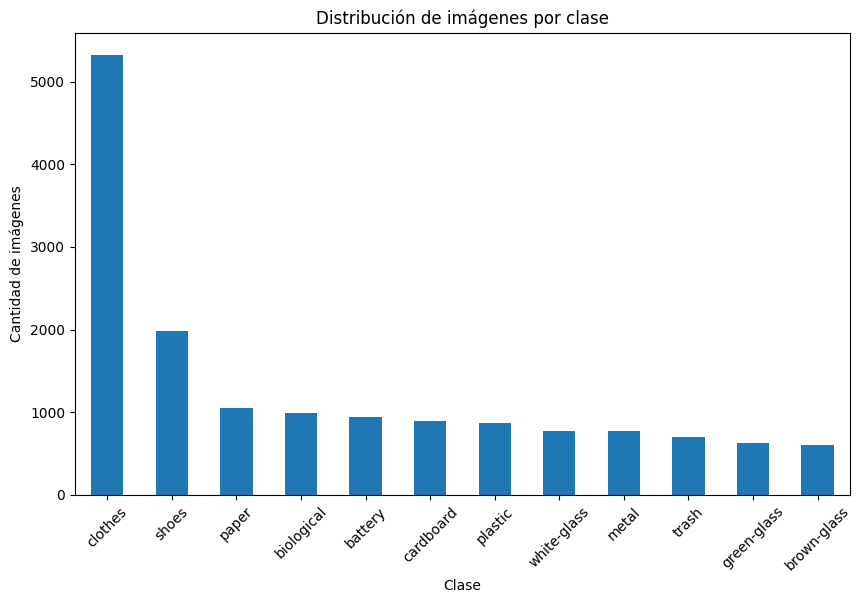

In [ ]:
# Extraer características del dataset
total_images, distribution, resolutions = extraer_caracteristicas(data_GC_12)

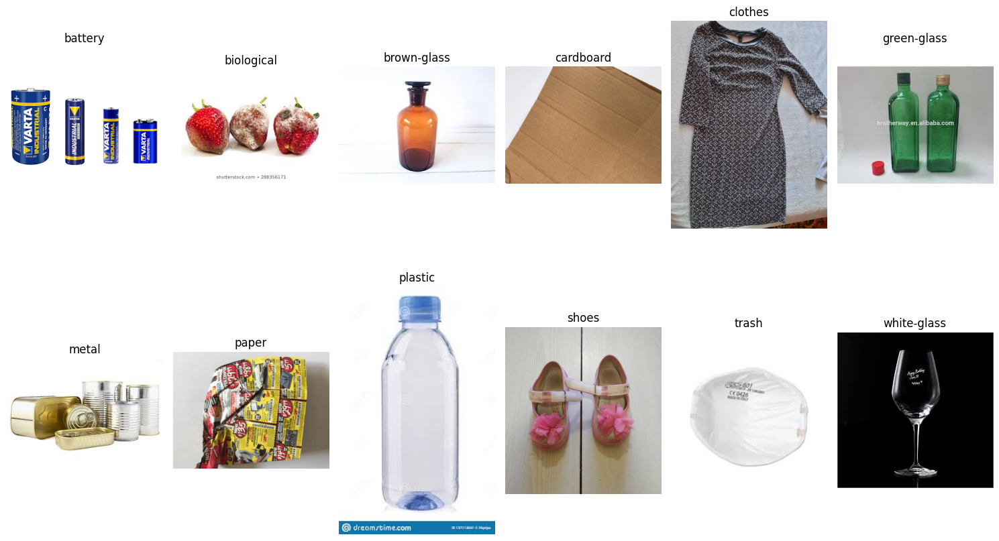

In [ ]:
visualizacion_aleatoria_clases(data_GC_12)

#### Garbage Classification (10 classes)

In [ ]:
path = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification10"
data_GC_10 = crear_DataFrame(path)

In [ ]:
data_GC_10

,path,target,filename
0,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery_1.jpg
1,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery_10.jpg
2,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery_100.jpg
3,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery_101.jpg
4,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery_102.jpg
...,...,...,...
23637,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash_95.jpg
23638,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash_96.jpg
23639,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash_97.jpg
23640,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash_98.jpg


Total de imágenes: 23642
Distribución por clase:
target
clothes       5325
glass         4097
paper         2727
plastic       2542
cardboard     2341
shoes         1977
metal         1869
biological     985
battery        945
trash          834
Name: count, dtype: int64
Algunas resoluciones de imágenes:
0    (275, 183)
1    (225, 225)
2    (225, 225)
3    (225, 225)
4    (200, 169)
Name: resolution, dtype: object


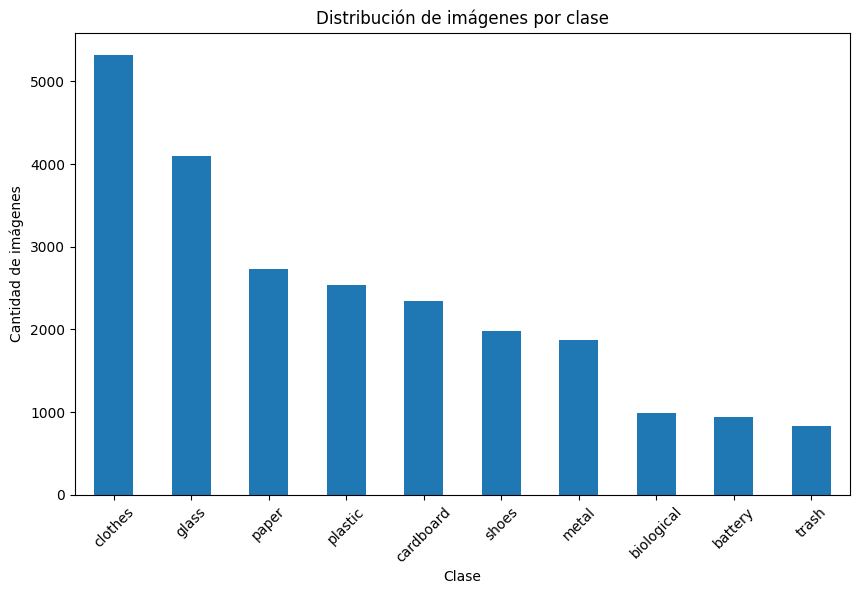

In [ ]:
# Extraer características del dataset
total_images, distribution, resolutions = extraer_caracteristicas(data_GC_10)

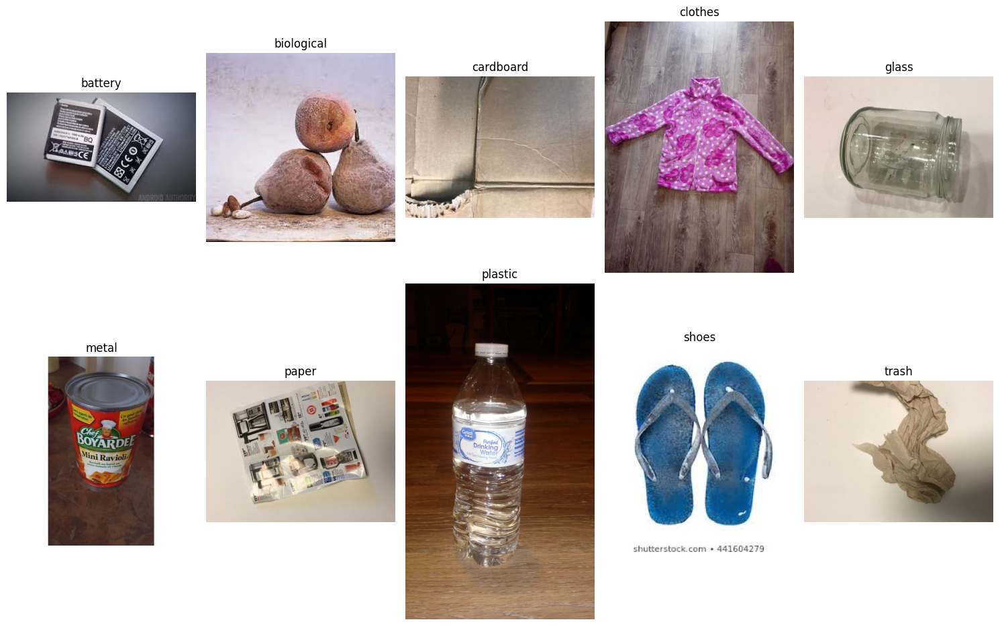

In [ ]:
visualizacion_aleatoria_clases(data_GC_10)

#### Garbage Classification (6 classes)

In [8]:
path = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification6/Garbage classification/Garbage classification"
data_GC_6 = crear_DataFrame(path)

In [ ]:
data_GC_6

,path,target,filename
0,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,cardboard,cardboard/cardboard1.jpg
1,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,cardboard,cardboard/cardboard10.jpg
2,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,cardboard,cardboard/cardboard100.jpg
3,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,cardboard,cardboard/cardboard101.jpg
4,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,cardboard,cardboard/cardboard102.jpg
...,...,...,...
2522,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash95.jpg
2523,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash96.jpg
2524,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash97.jpg
2525,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,trash,trash/trash98.jpg


Total de imágenes: 2527
Distribución por clase:
target
paper        594
glass        501
plastic      482
metal        410
cardboard    403
trash        137
Name: count, dtype: int64
Algunas resoluciones de imágenes:
0    (512, 384)
1    (512, 384)
2    (512, 384)
3    (512, 384)
4    (512, 384)
Name: resolution, dtype: object


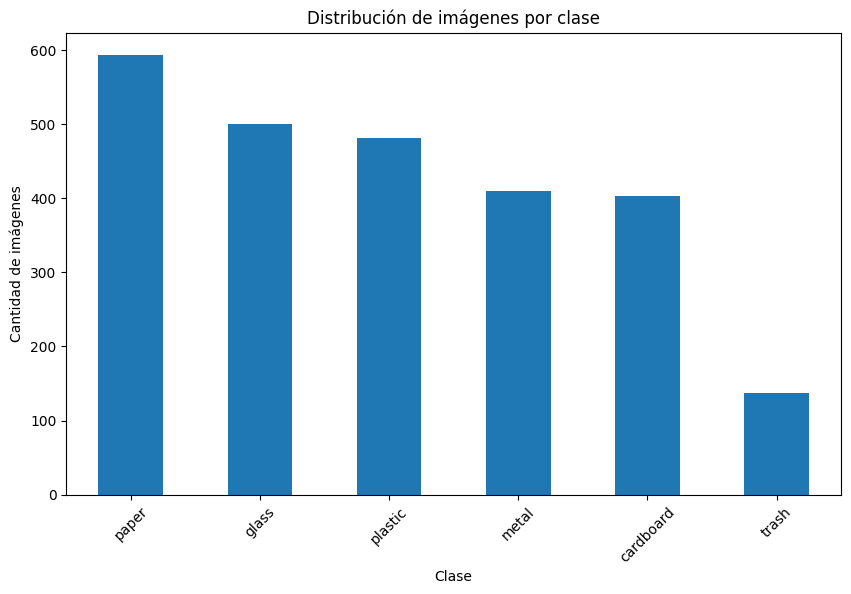

In [ ]:
# Extraer características del dataset
total_images, distribution, resolutions = extraer_caracteristicas(data_GC_6)

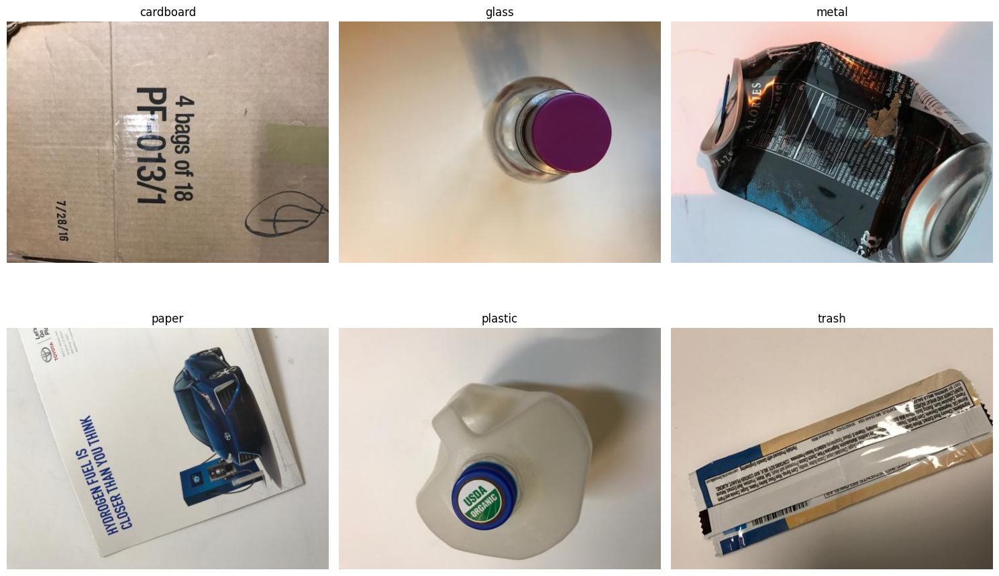

In [ ]:
visualizacion_aleatoria_clases(data_GC_6)

#### Waste Classification data

In [ ]:
path = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/waste-classification-data/DATASET/TRAIN"
data_GC_2 = crear_DataFrame(path)

In [ ]:
data_GC_2

,path,target,filename
0,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,O,O/O_9099.jpg
1,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,O,O/O_91.jpg
2,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,O,O/O_910.jpg
3,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,O,O/O_9100.jpg
4,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,O,O/O_9101.jpg
...,...,...,...
17914,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,R,R/R_1312.jpg
17915,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,R,R/R_1313.jpg
17916,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,R,R/R_1314.jpg
17917,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,R,R/R_1315.jpg


Total de imágenes: 17919
Distribución por clase:
target
O    12565
R     5354
Name: count, dtype: int64
Algunas resoluciones de imágenes:
0    (210, 230)
1    (275, 183)
2    (259, 194)
3    (275, 183)
4    (275, 183)
Name: resolution, dtype: object


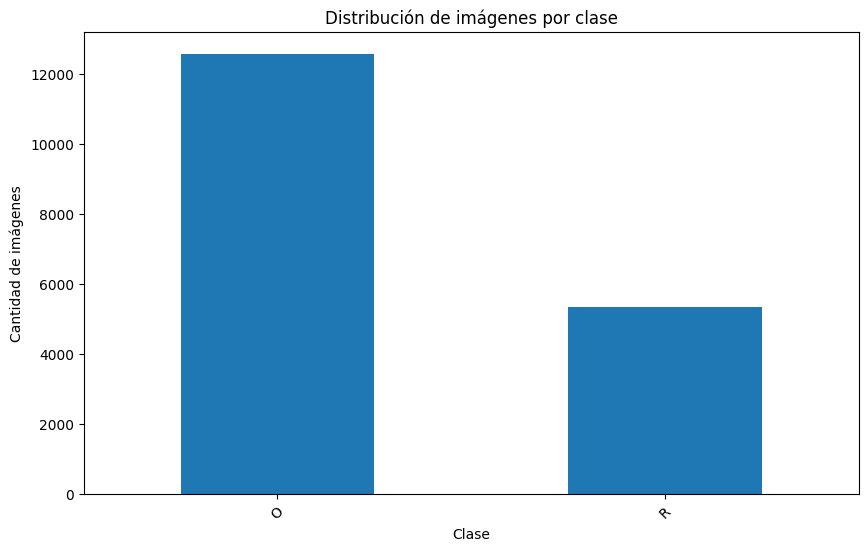

In [ ]:
# Extraer características del dataset
total_images, distribution, resolutions = extraer_caracteristicas(data_GC_2)

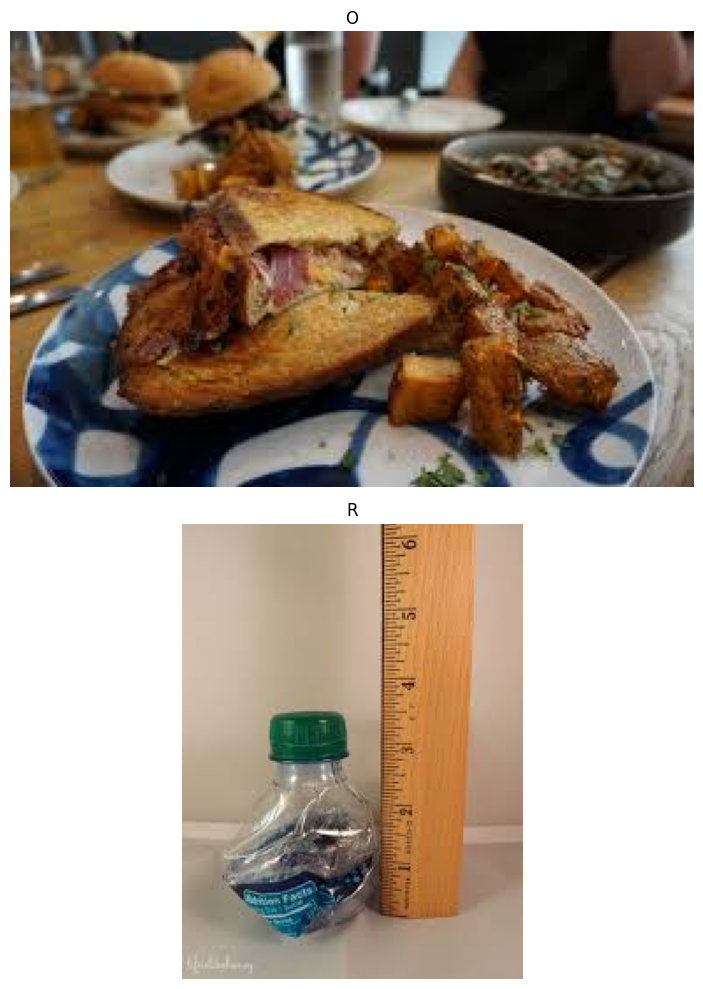

In [ ]:
visualizacion_aleatoria_clases(data_GC_2)

#### Trashnet

In [ ]:
ruta_guardado = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/trashnet"
dataset_trashnet = load_from_disk(ruta_guardado)

In [ ]:
# Convertir el conjunto de entrenamiento en un DataFrame
df_train = dataset_trashnet["train"].to_pandas()
# Crear un diccionario para mapear las etiquetas numéricas a nombres de clases
label_to_class = {0: "cardboard", 1: "glass", 2: "metal", 3: "paper", 4: "plastic", 5: "trash"}
# Crear archivos temporales para las imágenes
image_paths = []
for idx, row in df_train.iterrows():
    fd, path = mkstemp(suffix='.jpg')
    with os.fdopen(fd, 'wb') as tmp:
        tmp.write(row['image']['bytes'])
    image_paths.append(path)

df_train['path'] = image_paths
# Añadir columna 'target' como copia de 'label'
df_train['target'] = df_train['label'].map(label_to_class)


In [ ]:
# Llamar a la función para extraer características
total_images, distribution, resoluciones = extraer_caracteristicas(df_train)

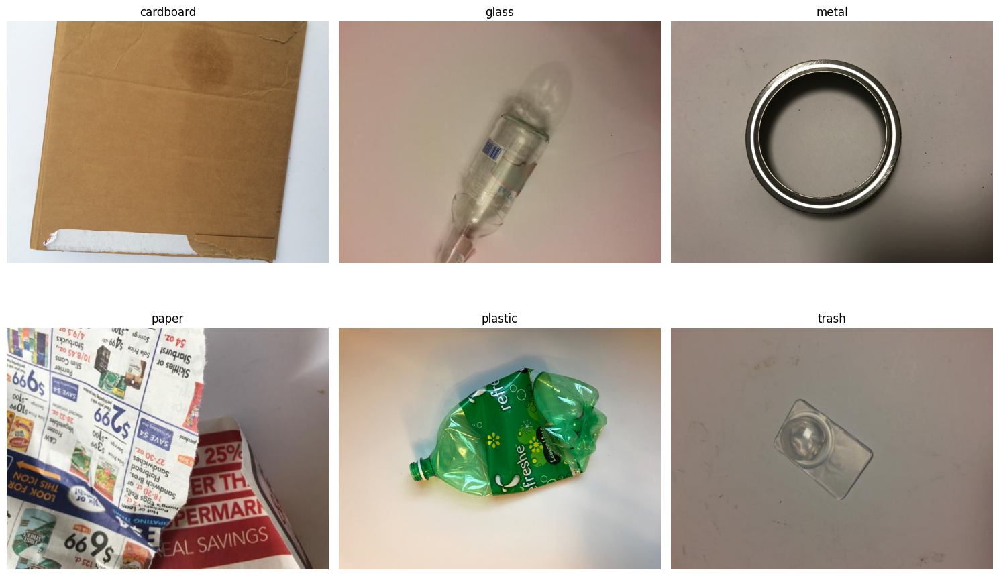

In [ ]:
visualizacion_aleatoria_clases(df_train)

In [ ]:
# Agregar una columna con nombres de imagenes basados en la clase
df_train['name_img'] = df_train.groupby('target').cumcount() + 1
df_train['name_img'] = df_train.apply(lambda row: f"{row['target']}{row['name_img']}.jpg", axis=1)

In [ ]:
# Directorio principal para guardar las imágenes
main_dir = 'Trashnet'

# Crear el directorio principal si no existe
os.makedirs(main_dir, exist_ok=True)

# Guardar las imágenes en las carpetas correspondientes
for _, row in df_train.iterrows():
    class_dir = os.path.join(main_dir, row['target'])
    os.makedirs(class_dir, exist_ok=True)

    src_path = row['path']  # Path original de la imagen
    dst_path = os.path.join(class_dir, row['name_img'])  # Path destino con el nuevo nombre

    # Copiar la imagen al nuevo directorio con el nuevo nombre
    shutil.copy(src_path, dst_path)

In [ ]:
!cp -r "Trashnet" "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets"

## 3.  Selección DataSet

Se escoge el Dataset 12 clases para su tratamiento
teniendo en cuenta la normatividad para la clasificación.

[Garbage_Classification 12 clases - Mejorado](https://www.kaggle.com/datasets/huberthamelin/garbage-classification-labels-corrections)




In [ ]:
# Directorio del conjunto de datos
path_dataset = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/garbage-classification-corrections/garbage_classification_enhanced"
data_select = crear_DataFrame(path_dataset)

In [ ]:
data_select

,path,target,filename
0,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery1.jpg
1,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery10.jpg
2,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery100.jpg
3,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery101.jpg
4,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,battery,battery/battery102.jpg
...,...,...,...
15865,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass94.jpg
15866,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass96.jpg
15867,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass97.jpg
15868,/content/drive/MyDrive/07MIAR_TFM_Clasisficaci...,white-glass,white-glass/white-glass98.jpg


In [ ]:
# Extraer características del dataset
total_images, distribution, resolutions = extraer_caracteristicas(data_select)

Total de imágenes: 15870
Distribución por clase:
target
clothes        5286
shoes          2006
paper          1108
biological     1035
battery         979
cardboard       936
plastic         901
metal           837
white-glass     796
trash           726
green-glass     641
brown-glass     619
Name: count, dtype: int64


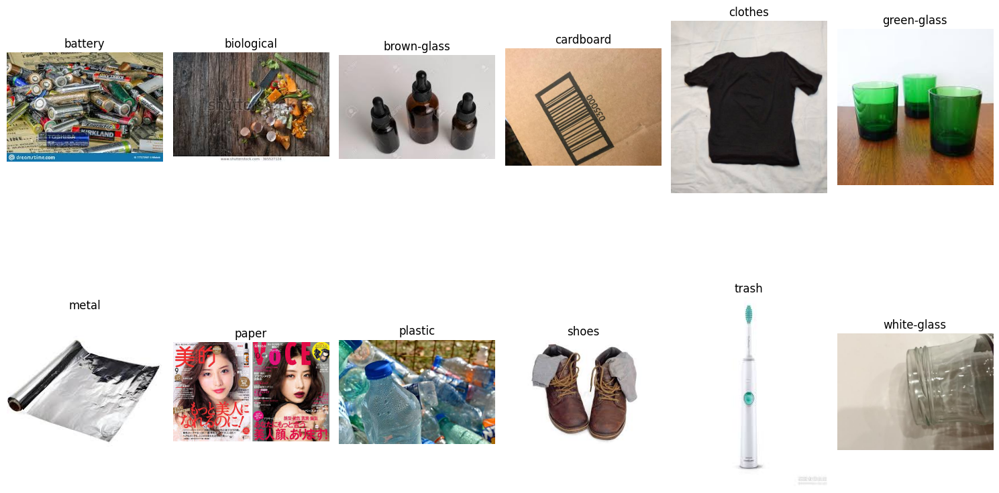

In [ ]:
visualizacion_aleatoria_clases(data_select)

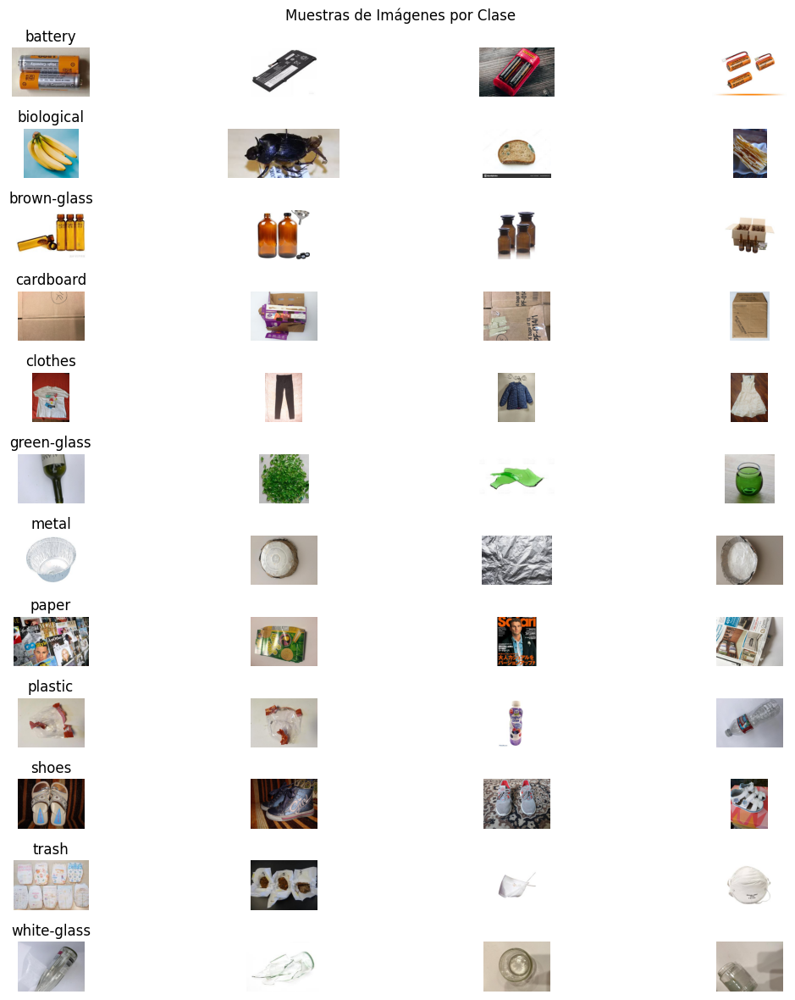

In [ ]:
# Muestra de imágenes por clase 4
num_samples_per_class = 4
classes = os.listdir(path_dataset)
plt.figure(figsize=(12, 12))
for i, class_name in enumerate(classes):
    class_dir = os.path.join(path_dataset, class_name)
    image_files = os.listdir(class_dir)[:num_samples_per_class]
    for j, image_file in enumerate(image_files):
        image_path = os.path.join(class_dir, image_file)
        img = plt.imread(image_path)
        plt.subplot(len(classes), num_samples_per_class, i * num_samples_per_class + j + 1)
        plt.imshow(img)
        plt.axis('off')
        if j == 0:
            plt.title(class_name)
plt.suptitle('Muestras de Imágenes por Clase')
plt.tight_layout()
plt.show()


In [ ]:
# Distribución de tamaños de imágenes
# Lista de clases de residuos sólidos
image_sizes = []
for class_name in classes:
    class_dir = os.path.join(path_dataset, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        img = plt.imread(image_path)
        image_sizes.append(img.shape[:2])

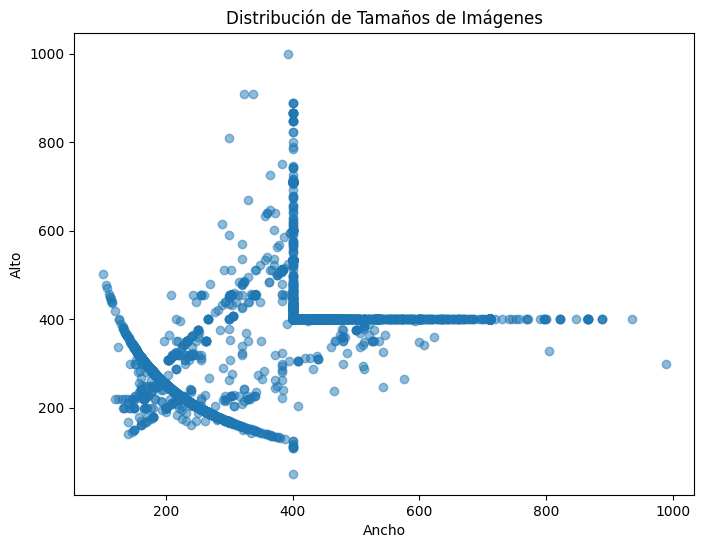

In [ ]:
# Visualizacion de la distribución de tamaños de imágenes

df_sizes = pd.DataFrame(image_sizes, columns=['Ancho', 'Alto'])

plt.figure(figsize=(8, 6))
plt.scatter(df_sizes['Ancho'], df_sizes['Alto'], alpha=0.5)
plt.xlabel('Ancho')
plt.ylabel('Alto')
plt.title('Distribución de Tamaños de Imágenes')
plt.show()

Se observa que las imagenes del dataset tienen tamaños variados unas de mayor tamaño que otras.

## 3. Acondicionando el conjunto de datos

Después de inspeccionar el conjunto de datos del dataset seleccionado se tienen dos observaciones principales: los tamaños de las imagenes son variados y la cantidad de imagenes por clases no esta equilibrada. La que menos imagenes tiene es la clase Brown-Glass con 619 y la que más tiene es la clase Clothes con 5286.

In [ ]:
data_select.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15870 entries, 0 to 15869
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   path      15870 non-null  object
 1   target    15870 non-null  object
 2   filename  15870 non-null  object
dtypes: object(3)
memory usage: 372.1+ KB


### 3.1 Equilibrio dataset - submuestreo

<class 'pandas.core.frame.DataFrame'>
Index: 10435 entries, 0 to 15869
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   path      10435 non-null  object
 1   target    10435 non-null  object
 2   filename  10435 non-null  object
dtypes: object(3)
memory usage: 326.1+ KB
Balance de clases en el dataframe equilibrado:
target
biological     1000
clothes        1000
paper          1000
shoes          1000
battery         979
cardboard       936
plastic         901
metal           837
white-glass     796
trash           726
green-glass     641
brown-glass     619
Name: count, dtype: int64


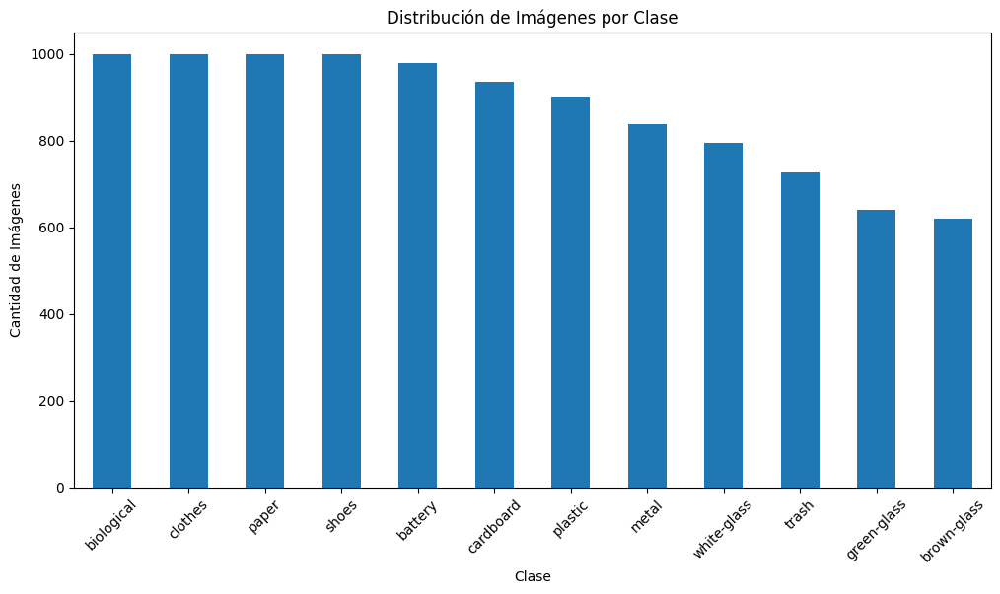

In [ ]:
# Equilibrar la cantidad de imagenes de las dos clases con mayor numero

# Extraer las clases únicas de la columna 'target'
classes = data_select['target'].unique()

# Obtener el número de imágenes por clase
class_counts = data_select['target'].value_counts()

# Definir el número deseado de imágenes para las clases con mayor número
desired_images = 1000

# Crear una lista vacía para almacenar los dataframes equilibrados por clase
balanced_dfs = []

# Iterar sobre cada clase
for clase in classes:
    # Filtrar el dataframe por clase
    df_clase = data_select[data_select['target'] == clase]

    # Equilibrar el número de imágenes para la clase actual
    if len(df_clase) > desired_images:
        df_clase = df_clase.sample(n=desired_images, random_state=42)

    # Agregar el dataframe equilibrado a la lista
    balanced_dfs.append(df_clase)

# Concatenar los dataframes equilibrados en uno solo
df_balanced = pd.concat(balanced_dfs)
df_balanced.info()
# Verificar el balance de las clases después de equilibrar el dataframe
class_counts_balanced = df_balanced['target'].value_counts()
print("Balance de clases en el dataframe equilibrado:")
print(class_counts_balanced)
# Visualizar la distribución por clases
plt.figure(figsize=(12, 6))
class_counts_balanced.plot(kind='bar')
plt.title('Distribución de Imágenes por Clase')
plt.xlabel('Clase')
plt.ylabel('Cantidad de Imágenes')
plt.xticks(rotation=45)
plt.show()

### 3.2 Equilibrio dataset - sobremuestreo

In [ ]:
# Equilibrar la cantidad de imagenes de las clases minoristas

# Función para completar hasta 1000 muestras por clase
def completar_clases(df_balanced, data_GC_6, clases_objetivo, limite=1000):

    for clase in clases_objetivo:
        # Filtrar DataFrames por la clase actual
        df_balanced_clase = df_balanced[df_balanced['target'] == clase]
        data_GC_6_clase = data_GC_6[data_GC_6['target'] == clase]

        # Número de muestras a añadir
        faltan = limite - len(df_balanced_clase)

        if faltan > 0:
          if len(data_GC_6_clase) > 0:
            # Seleccionar muestras adicionales de data_GC_6
            adicionales = data_GC_6_clase.sample(n=min(faltan, len(data_GC_6_clase)), replace=False).copy()
            # Añadir las muestras adicionales a df_balanced
            df_balanced = pd.concat([df_balanced, adicionales], ignore_index=True)
          else:
            print(f"No hay suficientes datos en df2 para la clase '{clase}'")

    return df_balanced

In [ ]:
# Completar df_balanced hasta el límite de 1000 muestras por clase con imágenes de data_GC_6

# Especificar las clases que se quieren agregar
clases_objetivo = ['cardboard', 'plastic', 'metal', 'trash']

# Llamar a la función para completar las clases objetivo
df_completado = completar_clases(df_balanced, data_GC_6, clases_objetivo, limite=1000)

# info
df_completado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10898 entries, 0 to 10897
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   path      10898 non-null  object
 1   target    10898 non-null  object
 2   filename  10898 non-null  object
dtypes: object(3)
memory usage: 255.5+ KB


Distribución por clase:
target
biological     1000
cardboard      1000
clothes        1000
metal          1000
paper          1000
plastic        1000
shoes          1000
battery         979
trash           863
white-glass     796
green-glass     641
brown-glass     619
Name: count, dtype: int64


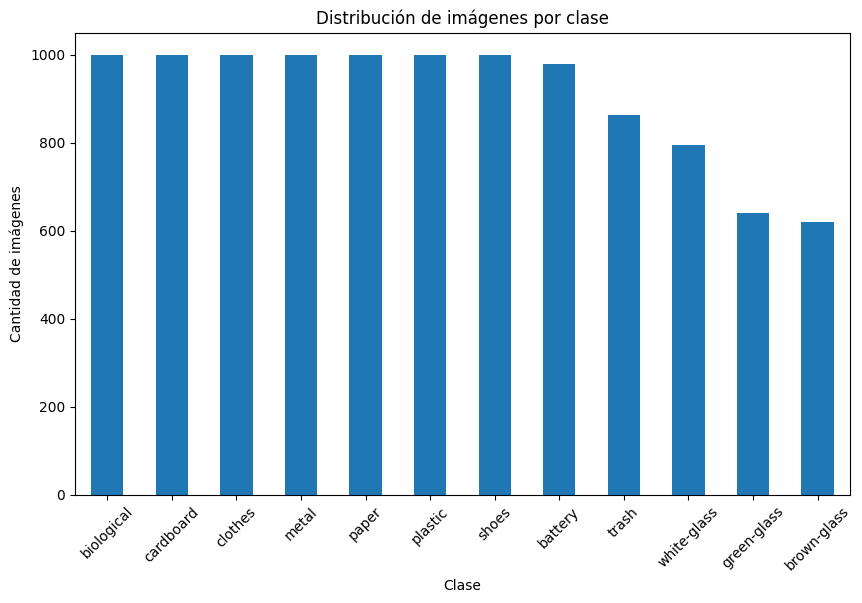

In [ ]:
# Calcular la distribución por clase
distribution = df_completado['target'].value_counts()
print("Distribución por clase:")
print(distribution)

# Graficar la distribución por clase
plt.figure(figsize=(10, 6))
distribution.plot(kind='bar')
plt.title('Distribución de imágenes por clase')
plt.xlabel('Clase')
plt.ylabel('Cantidad de imágenes')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Completar df_completado hasta el límite de 1000 muestras por clase con imágenes de df_train dataset Trashnet

# Especificar las clases que se quieren agregar
clases_objetivo = ['trash']

# Llamar a la función para completar las clases objetivo
df_completado_2 = completar_clases(df_completado, df_train, clases_objetivo, limite=1000)

# info
df_completado_2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11035 entries, 0 to 11034
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   path      11035 non-null  object 
 1   target    11035 non-null  object 
 2   filename  10898 non-null  object 
 3   image     137 non-null    object 
 4   label     137 non-null    float64
dtypes: float64(1), object(4)
memory usage: 431.2+ KB


Distribución por clase:
target
biological     1000
cardboard      1000
clothes        1000
metal          1000
paper          1000
plastic        1000
shoes          1000
trash          1000
battery         979
white-glass     796
green-glass     641
brown-glass     619
Name: count, dtype: int64


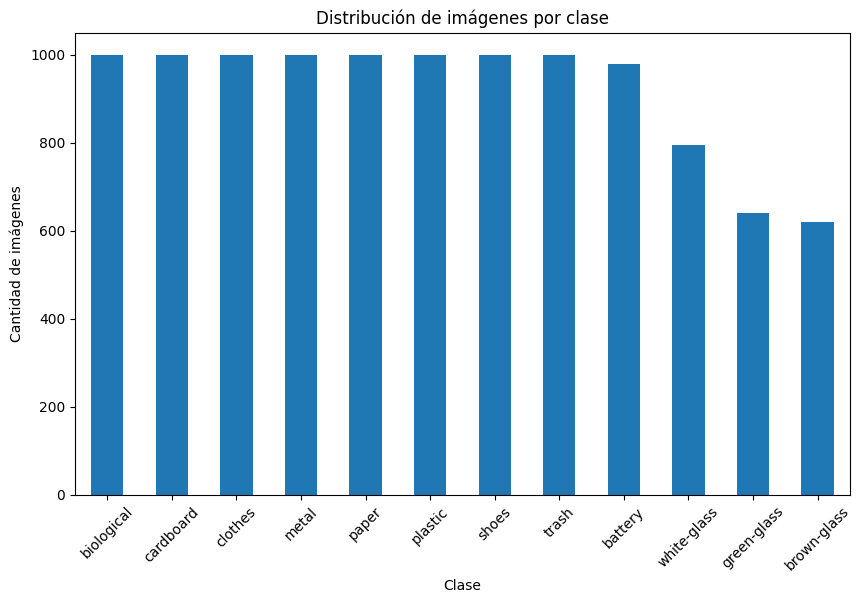

In [ ]:
# Calcular la distribución por clase
distribution = df_completado_2['target'].value_counts()
print("Distribución por clase:")
print(distribution)

# Graficar la distribución por clase
plt.figure(figsize=(10, 6))
distribution.plot(kind='bar')
plt.title('Distribución de imágenes por clase')
plt.xlabel('Clase')
plt.ylabel('Cantidad de imágenes')
plt.xticks(rotation=45)
plt.show()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 981 entries, 0 to 980
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   path      981 non-null    object
 1   target    981 non-null    object
 2   filename  981 non-null    object
dtypes: object(3)
memory usage: 23.1+ KB
Distribución por clase:
target
white-glass    583
brown-glass    228
green-glass    170
Name: count, dtype: int64


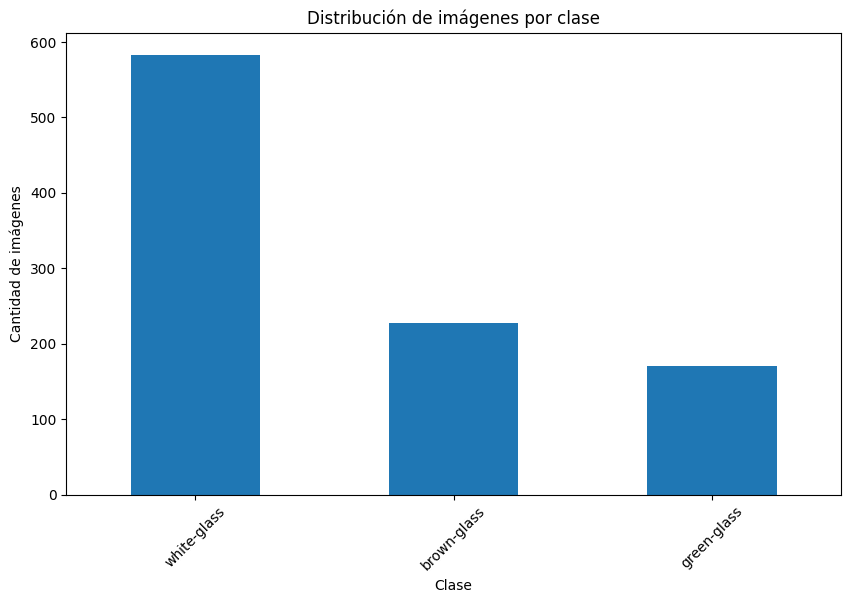

In [ ]:
# Directorio del conjunto de datos Glass
path_dataset = "/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/glass"
df_glass = crear_DataFrame(path_dataset)
df_glass.info()
# Calcular la distribución por clase
distribution = df_glass['target'].value_counts()
print("Distribución por clase:")
print(distribution)

# Graficar la distribución por clase
plt.figure(figsize=(10, 6))
distribution.plot(kind='bar')
plt.title('Distribución de imágenes por clase')
plt.xlabel('Clase')
plt.ylabel('Cantidad de imágenes')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Completar df_completado2 hasta el límite de 1000 muestras por clase con imágenes seleccionadas manualmente entre el dataset 6 y Trashnet

# Especificar las clases que se quieren agregar
clases_objetivo = ['white-glass','green-glass','brown-glass']

# Llamar a la función para completar las clases objetivo
df_final = completar_clases(df_completado_2, df_glass, clases_objetivo, limite=1000)

# info
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11637 entries, 0 to 11636
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   path      11637 non-null  object 
 1   target    11637 non-null  object 
 2   filename  11500 non-null  object 
 3   image     137 non-null    object 
 4   label     137 non-null    float64
dtypes: float64(1), object(4)
memory usage: 454.7+ KB


Distribución por clase:
target
biological     1000
cardboard      1000
clothes        1000
metal          1000
paper          1000
plastic        1000
shoes          1000
trash          1000
white-glass    1000
battery         979
brown-glass     847
green-glass     811
Name: count, dtype: int64


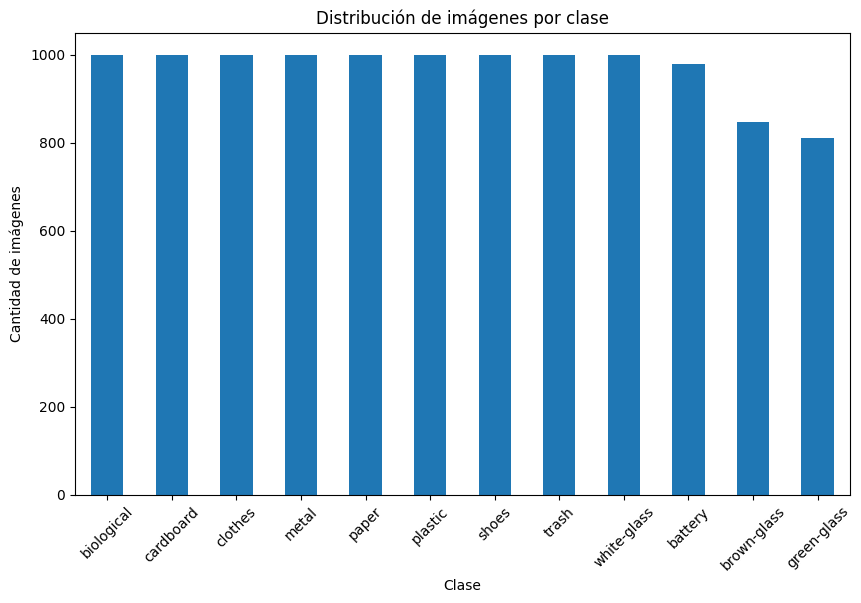

In [ ]:
# Calcular la distribución por clase
distribution = df_final['target'].value_counts()
print("Distribución por clase:")
print(distribution)
# Graficar la distribución por clase
plt.figure(figsize=(10, 6))
distribution.plot(kind='bar')
plt.title('Distribución de imágenes por clase')
plt.xlabel('Clase')
plt.ylabel('Cantidad de imágenes')
plt.xticks(rotation=45)
plt.show()

### 3.3 Guardar imagenes en drive

In [ ]:
# Agregar una columna con nombres de imagenes basados en la clase
df_final['name_img'] = df_final.groupby('target').cumcount() + 1
df_final['name_img'] = df_final.apply(lambda row: f"{row['target']}{row['name_img']}.jpg", axis=1)

In [ ]:
# Directorio principal para guardar las imágenes
main_dir = '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos'

# Crear el directorio principal si no existe
os.makedirs(main_dir, exist_ok=True)

# Guardar las imágenes en las carpetas correspondientes
for _, row in df_final.iterrows():
    class_dir = os.path.join(main_dir, row['target'])
    os.makedirs(class_dir, exist_ok=True)

    src_path = row['path']  # Path original de la imagen
    dst_path = os.path.join(class_dir, row['name_img'])  # Path destino con el nuevo nombre

    # Copiar la imagen al nuevo directorio con el nuevo nombre
    shutil.copy(src_path, dst_path)

In [ ]:
# Limpieza de archivos temporales
for path in image_paths:
    os.remove(path)

### 3.4 Eliminación - Duplicados

In [ ]:
def dhash(image, hash_size=8):
    """
    Calcula el dhash de la imagen de entrada.
    :param image: Imagen a la cuaal le calcularemos el dhash.
    :param hash_size: Número de bytes en el hash resultante.
    """
    # Resdimensionamos la imagen con base al tamaño del hash.
    resized = cv2.resize(image, (hash_size + 1, hash_size))

    # Generamos la imagen de diferencias de píxeles adyacentes.
    diff = resized[:, 1:] > resized[:, :-1]

    # Calculamos el hash.
    return sum([2 ** i for i, v in enumerate(diff.flatten()) if v])

In [10]:
# Ruta a tu dataset principal
dataset_path = '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos'

# Obtener las subcarpetas (clases)
class_folders = [f.path for f in os.scandir(dataset_path) if f.is_dir()]
print(class_folders)


['/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/biological', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/brown-glass', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/cardboard', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/clothes', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/green-glass', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/metal', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/paper', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/plastic', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/shoes', '/content/drive/MyDrive/07MIAR_TFM_Clasisf

In [ ]:
remove = -1
print('Calculando los hashes...')
# Iteramos sobre las carpetas de clases
for class_folder in class_folders:
    print(f'Procesando la carpeta: {class_folder}')
    # Cargamos la lista de imágenes a procesar.
    image_paths = list(paths.list_images(class_folder))
    print(image_paths)
    hashes = {}  # Aquí guardaremos los hashes.

    # Computamos el hash de cada imagen. Ten en cuenta que asociamos cada hash a una lista de rutas, por lo que
    # si hay imágenes repetidas, pasará que un hash estará vinculado a una lista de más de un elemento.
    for image_path in image_paths:
        image = cv2.imread(image_path)
        hash = dhash(image)

        p = hashes.get(hash, [])
        p.append(image_path)
        hashes[hash] = p

    # Iteramos sobre los hashes.
    for hash, hashed_paths in hashes.items():
        # Si el hash en cuestión está asociado a más de una ruta, entonces tenemos una imagen repetida.
        if len(hashed_paths) > 1:
            # Si no vamos a remover los duplicados, entonces construiremos un montaje para mostrarlos.
            if remove < 1:
                montage = None

                # Construimos un mosaico de todos los duplicados.
                for p in hashed_paths:
                    # Leemos y redimensionamos la imagen.
                    image = cv2.imread(p)
                    image = cv2.resize(image, (150, 150))

                    if montage is None:
                        montage = image
                    else:
                        montage = np.hstack([montage, image])

                # Imprimimos información sobre los duplicados y mostramos el montaje en pantalla.
                print(f'Hash: {hash}')
                print(f'# duplicados: {len(hashed_paths)}')
                print('---')
                cv2_imshow(montage)
                cv2.waitKey(0)
            else:
                # Removemos todos los duplicados salvo el primero.
                for p in hashed_paths[1:]:
                    os.remove(p)
                print(f'Eliminación duplicados de imágenes completada clase: {class_folder}')

Calculando los hashes...
Procesando la carpeta: /content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery
['/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery1.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery2.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery3.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery4.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery5.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery6.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery7.jpg', '/content/drive/MyDrive/07MIAR_TFM_Clasisficacion_Residuos/datasets/residuos_solidos/battery/battery8.j

### 3.5 Características dataset final

In [15]:
# Directorio del conjunto de datos
data_residuos = crear_DataFrame(dataset_path)
data_residuos.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10918 entries, 0 to 10917
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   path      10918 non-null  object
 1   target    10918 non-null  object
 2   filename  10918 non-null  object
dtypes: object(3)
memory usage: 256.0+ KB


Total de imágenes: 10918
Distribución por clase:
target
biological     1000
clothes        1000
paper          1000
shoes          1000
battery         979
cardboard       936
white-glass     906
plastic         901
trash           893
metal           837
brown-glass     735
green-glass     731
Name: count, dtype: int64
Algunas resoluciones de imágenes:
0    (280, 180)
1    (220, 165)
2    (275, 183)
3    (275, 183)
4    (224, 224)
Name: resolution, dtype: object


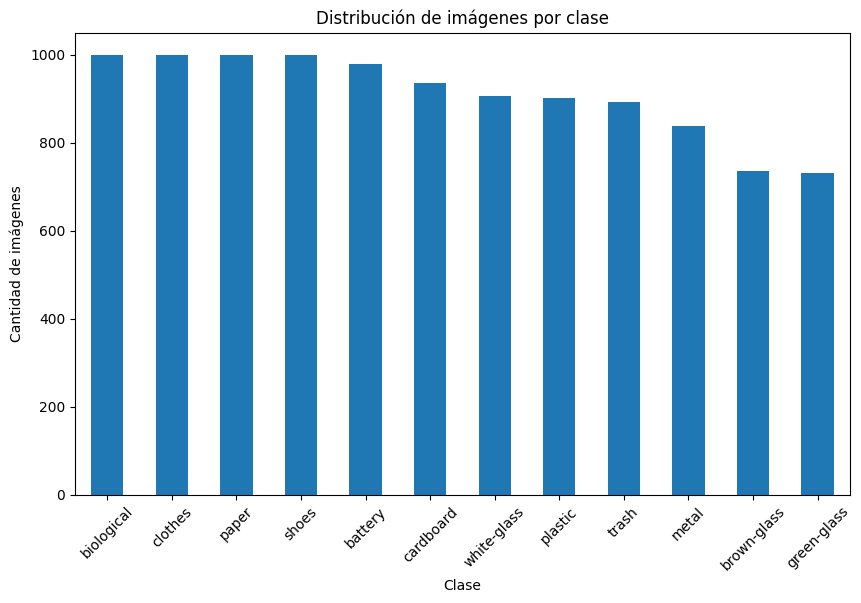

In [ ]:
# Extraer características del dataset
total_images, distribution, resolutions = extraer_caracteristicas(data_residuos)

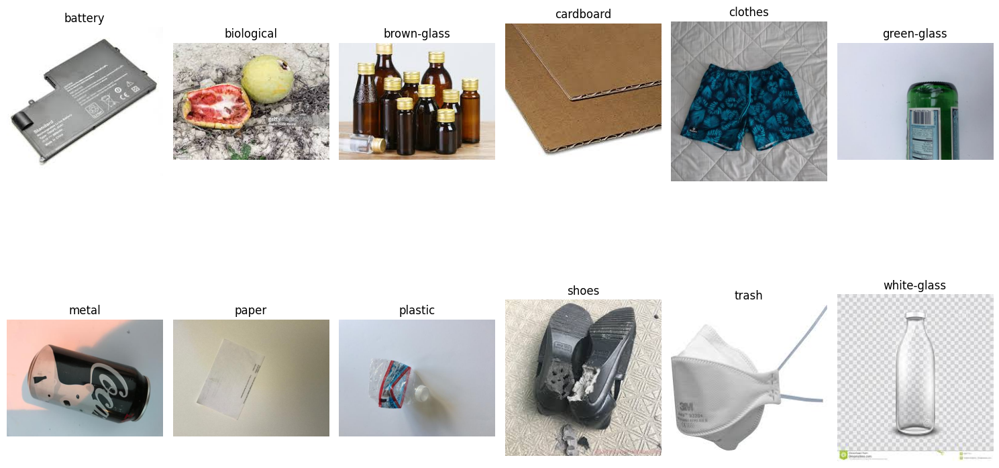

In [ ]:
visualizacion_aleatoria_clases(data_residuos)

In [11]:
# Distribución de tamaños de imágenes
# Lista de clases de residuos sólidos
classes = os.listdir(dataset_path)
image_sizes = []
for class_name in classes:
    class_dir = os.path.join(dataset_path, class_name)
    for image_file in os.listdir(class_dir):
        image_path = os.path.join(class_dir, image_file)
        img = plt.imread(image_path)
        image_sizes.append(img.shape[:2])

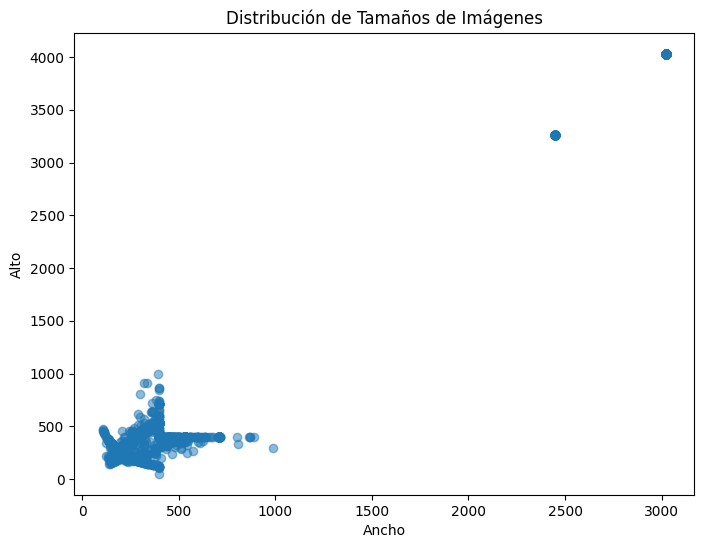

In [12]:
# Visualizacion de la distribución de tamaños de imágenes

df_sizes = pd.DataFrame(image_sizes, columns=['Ancho', 'Alto'])

plt.figure(figsize=(8, 6))
plt.scatter(df_sizes['Ancho'], df_sizes['Alto'], alpha=0.5)
plt.xlabel('Ancho')
plt.ylabel('Alto')
plt.title('Distribución de Tamaños de Imágenes')
plt.show()

In [13]:
# Función para obtener el formato y el número de canales de una imagen
def get_image_info(image_path):
    try:
        with Image.open(image_path) as img:
            return img.format, img.mode
    except:
        return None, None

In [16]:
# Obtener formato y número de canales para cada imagen en el dataframe
formats = []
channels = []

for path in data_residuos['path']:
    img_format, img_mode = get_image_info(path)
    formats.append(img_format)
    channels.append(img_mode)

# Añadir la información al dataframe
data_residuos['format'] = formats
data_residuos['channels'] = channels

# Mapear los modos de imagen a número de canales
channel_mapping = {
    '1': 1,  # (1-bit pixels, black and white)
    'L': 1,  # (8-bit pixels, black and white)
    'P': 1,  # (8-bit pixels, mapped to any other mode using a color palette)
    'RGB': 3,  # (3x8-bit pixels, true color)
    'RGBA': 4,  # (4x8-bit pixels, true color with transparency mask)
    'CMYK': 4,  # (4x8-bit pixels, color separation)
    'YCbCr': 3,  # (3x8-bit pixels, color video format)
    'I': 1,  # (32-bit signed integer pixels)
    'F': 1   # (32-bit floating point pixels)
}

data_residuos['num_channels'] = data_residuos['channels'].map(channel_mapping)


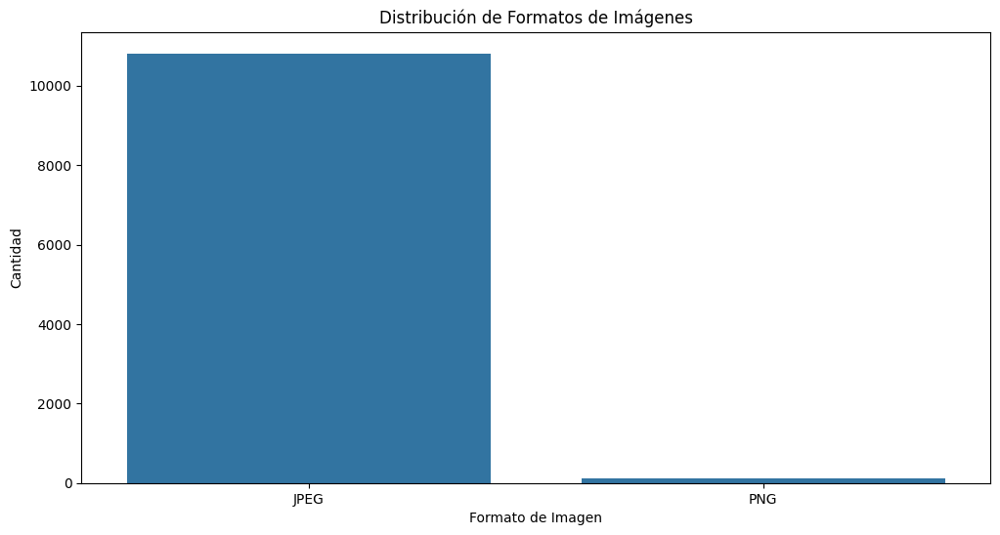

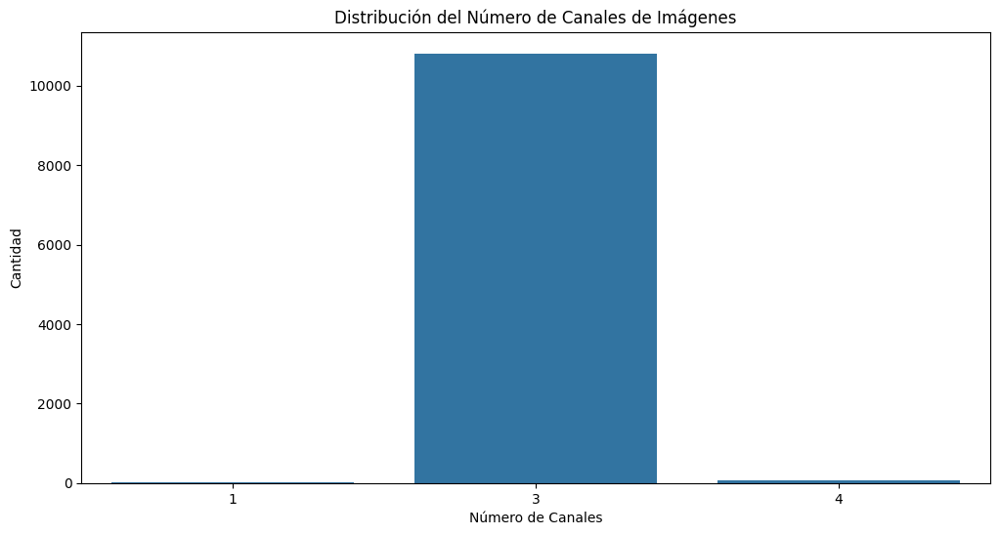

In [17]:
# Graficar la distribución de formatos de imagen
plt.figure(figsize=(12, 6))
sns.countplot(data=data_residuos, x='format')
plt.title('Distribución de Formatos de Imágenes')
plt.xlabel('Formato de Imagen')
plt.ylabel('Cantidad')
plt.show()

# Graficar la distribución del número de canales de imagen
plt.figure(figsize=(12, 6))
sns.countplot(data=data_residuos, x='num_channels')
plt.title('Distribución del Número de Canales de Imágenes')
plt.xlabel('Número de Canales')
plt.ylabel('Cantidad')
plt.show()
